In [2]:
import cv2
import math
import csv
import os
import tensorflow as tf
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont
from ultralytics.solutions.solutions import BaseSolution
from ultralytics.utils.plotting import Annotator, colors
from datetime import datetime
%matplotlib inline

2025-02-04 17:39:30.896306: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-04 17:39:30.935523: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-04 17:39:30.946308: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-04 17:39:30.949679: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-04 17:39:30.984582: I tensorflow/core/platform/cpu_feature_guar

In [3]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
os.environ['TF_GPU_ALLOCATOR'] = 'cuda_malloc_async'

Num GPUs Available:  1


I0000 00:00:1738687176.443577    5531 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1738687176.446625    5531 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1738687176.446800    5531 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355


https://www.digitalocean.com/community/tutorials/what-is-new-with-yolo

## EJERCICIO 1 
Vamos a usar el modleo YOLOv11 para detectar objetos en una imagen (en este caso vamos a aplicar el modelo directamente sin entrenarlo).
Vamos a aplicarlo en las imagenes deteccion_objetos.jpg y bus.jpg

Partiendo de la imagen deteccion_objetos.jpg y bus.jpg.



In [5]:
# Load a COCO-pretrained YOLO11n model  
model = YOLO("yolo11n.pt")  
results = model("./bus.jpg")  
results2 = model("./deteccion_objetos.jpg")  
results[0].show()
results2[0].show()



image 1/1 /home/iabd/Escritorio/IABD/IA/SAPA/Redes Neuronales/bus.jpg: 640x480 4 persons, 1 bus, 41.0ms
Speed: 2.2ms preprocess, 41.0ms inference, 71.1ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /home/iabd/Escritorio/IABD/IA/SAPA/Redes Neuronales/deteccion_objetos.jpg: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 4.5ms
Speed: 1.7ms preprocess, 4.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


## EJERCICIO 2
Vamos a repetir el ejercicio pero ahora vamos a modificar la salida para que quede de la siguiente forma:

![Imagen con la el resultado que se quiere obtener 1](./deteccion_objetos_solucion.png)

![Imagen con la el resultado que se quiere obtener 1](./bus_solucion.png)

Además sólo quiero que detecte los objetos cuya probabilidad sea mayor al 50%.

Ten en cuenta que al aplicar el modelo a una imagen devuelve diferentes datos:
 * Cajas:
    * Clase (cls)
    * Probabilidad (score)
    * Coordenadas de la caja xyxy

Para representar la imagen y añadir rectángulos, texto... puedes usar Image, ImageDraw, ImageFont de PIL. Dibujas la imagen con .Draw de (ImageDraw) con .rectangle y .text puedes ir añadiendo texto y rectángulos.


0: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 18.2ms
1: 640x640 4 persons, 1 bus, 18.2ms
Speed: 1.5ms preprocess, 18.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


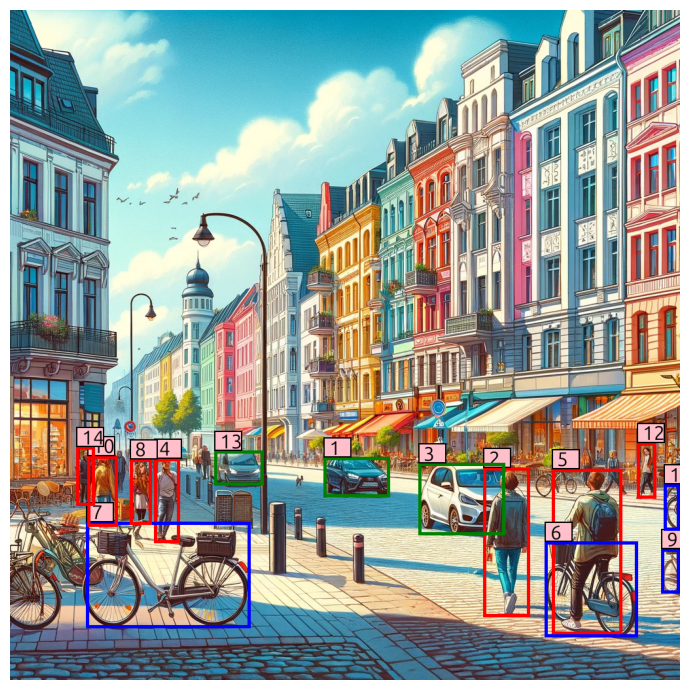

Recuadro 1: Clase=car, Score=0.88, Caja=[479.8882751464844, 683.6397705078125, 580.6798706054688, 744.2516479492188]
Recuadro 2: Clase=person, Score=0.87, Caja=[723.8831176757812, 699.6281127929688, 794.2301635742188, 927.2527465820312]
Recuadro 3: Clase=car, Score=0.85, Caja=[624.3212280273438, 692.6537475585938, 756.9239501953125, 802.4708862304688]
Recuadro 4: Clase=person, Score=0.84, Caja=[220.47178649902344, 685.431396484375, 259.8442077636719, 814.4321899414062]
Recuadro 5: Clase=person, Score=0.82, Caja=[828.3609619140625, 701.1053466796875, 935.8298950195312, 954.4529418945312]
Recuadro 6: Clase=bicycle, Score=0.78, Caja=[817.97509765625, 812.5693359375, 959.1559448242188, 958.2740478515625]
Recuadro 7: Clase=bicycle, Score=0.77, Caja=[116.632080078125, 782.1195678710938, 367.2386779785156, 944.4984741210938]
Recuadro 8: Clase=person, Score=0.72, Caja=[183.0309295654297, 686.3451538085938, 216.2439727783203, 786.7228393554688]
Recuadro 9: Clase=bicycle, Score=0.67, Caja=[995.5

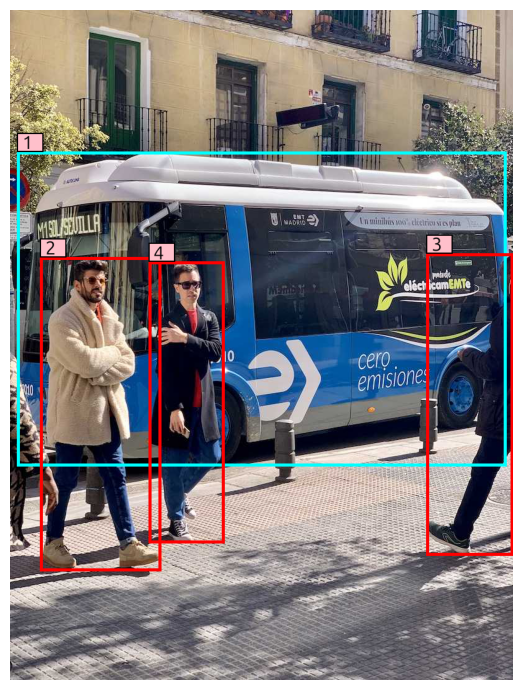

Recuadro 1: Clase=bus, Score=0.94, Caja=[11.94719409942627, 228.31512451171875, 799.189453125, 735.3086547851562]
Recuadro 2: Clase=person, Score=0.90, Caja=[48.64637756347656, 398.211669921875, 243.06797790527344, 904.5064086914062]
Recuadro 3: Clase=person, Score=0.85, Caja=[670.6040649414062, 392.3167724609375, 810.0, 879.6082153320312]
Recuadro 4: Clase=person, Score=0.84, Caja=[223.05950927734375, 405.5998229980469, 345.28387451171875, 859.7147216796875]


In [6]:
model = YOLO("Resultados/yolo11n.pt")
image_paths = ["./deteccion_objetos.jpg", "./bus.jpg"]
results = model(image_paths)

# Obtén la imagen con los recuadros
for i,_ in enumerate(results):
    detections = results[i].boxes 
    filtered_detections = []  

    for j, (cls, score, box) in enumerate(zip(detections.cls, detections.conf, detections.xyxy)):
        if score > 0.5:  
            filtered_detections.append((j, cls, score, box))

    image = Image.open(image_paths[i])
    draw = ImageDraw.Draw(image)
    font = ImageFont.truetype("usr/share/fonts/truetype/ubuntu/Ubuntu-B.ttf", size=30)

    legend = []

    colors = ["red", "blue", "green", "orange", "purple", "cyan", "magenta", "yellow", "pink", "brown"]
    def get_color_for_class(cls_idx):
        return colors[cls_idx % len(colors)] 

    for idx, (i, cls, score, box) in enumerate(filtered_detections, start=1):
        class_name = model.names[int(cls)]
        color = get_color_for_class(int(cls))
        box = box.tolist()

        legend.append(f"Recuadro {idx}: Clase={class_name}, Score={score:.2f}, Caja={box}")
        
        draw.rectangle([box[0], box[1], box[2], box[3]], outline=color, width=5)
        draw.rectangle([box[0], box[1]-30, box[0]+2 + 40, box[1]],fill="black")
        draw.rectangle([box[0]+2, box[1]-28, box[0] + 40, box[1]-2],fill="pink")
        draw.text((box[0]+8, box[1]-32), str(idx), fill="black",font=font)

    plt.figure(figsize=(13,7))
    plt.imshow(image)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    [print(i) for i in legend] 

## EJERCICIO 3
YOLOv11 también sirve para segmentación, aplica segmentación a las dos imágenes con las que estamos trabajando


0: 640x640 11 persons, 8 bicycles, 3 cars, 1 backpack, 6.2ms
1: 640x640 4 persons, 1 bus, 6.2ms
Speed: 1.2ms preprocess, 6.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


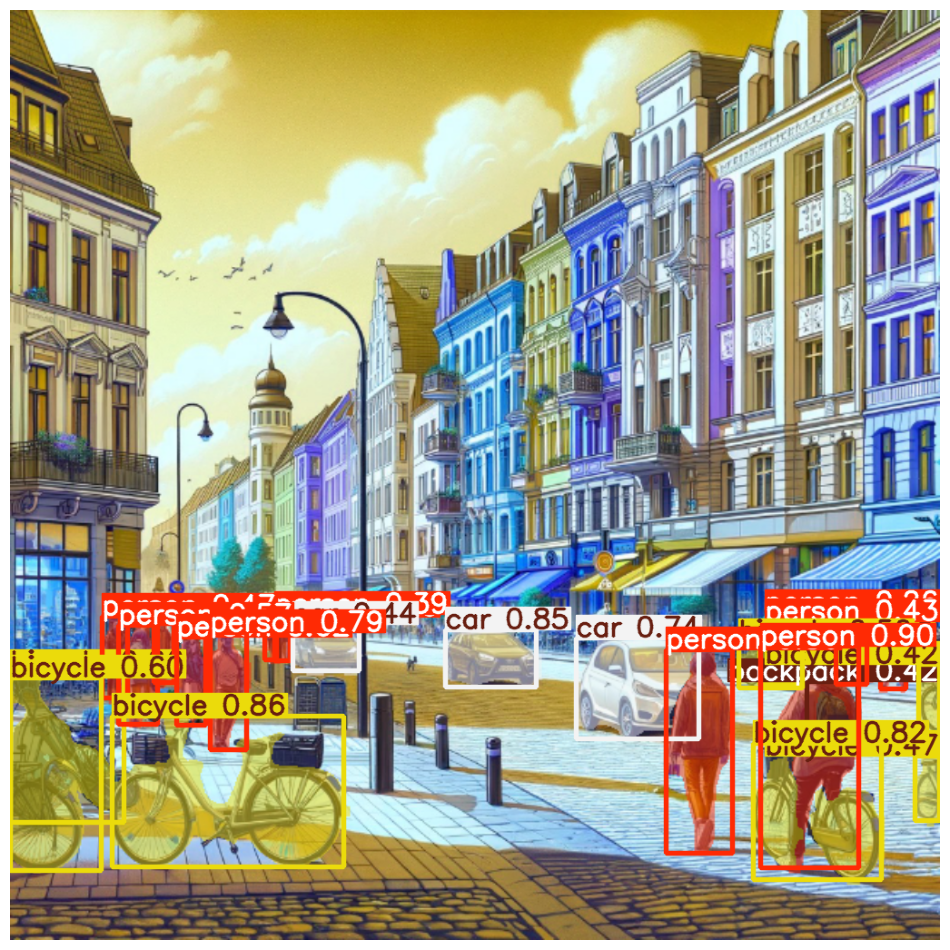

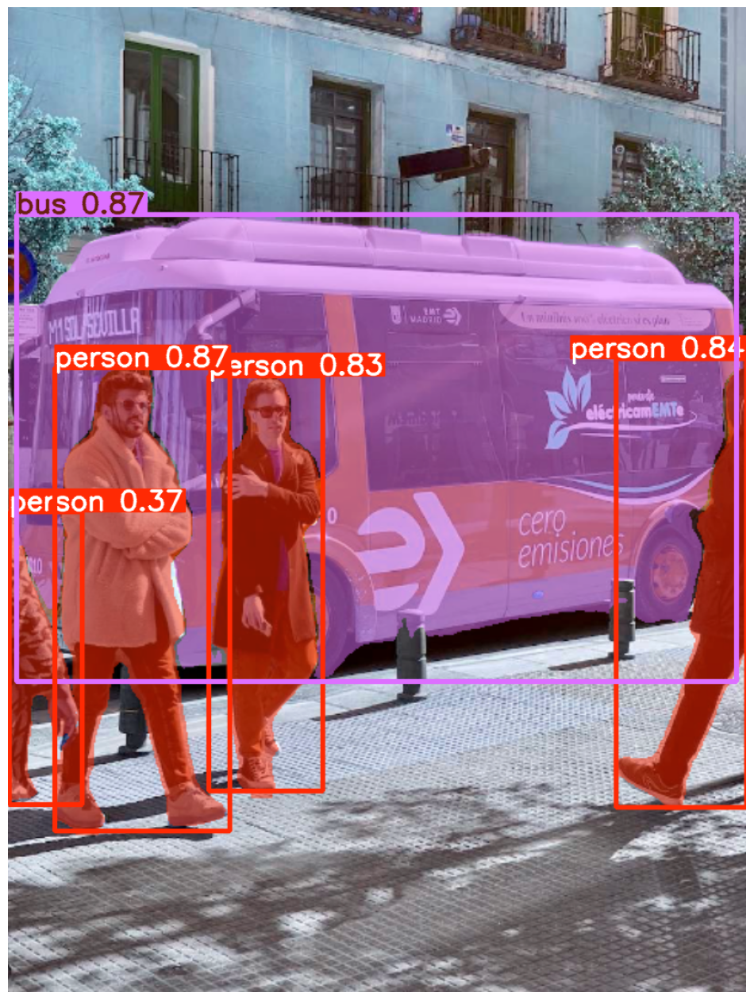

In [7]:
model = YOLO('Resultados/yolo11n-seg.pt')
image_paths = ["./deteccion_objetos.jpg", "./bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 4
De manera similar, podemos hacer la estimación de pose. Hazlo con las imágenes con las que estamos trabajando.


0: 640x640 2 persons, 6.2ms
1: 640x640 4 persons, 6.2ms
Speed: 1.6ms preprocess, 6.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


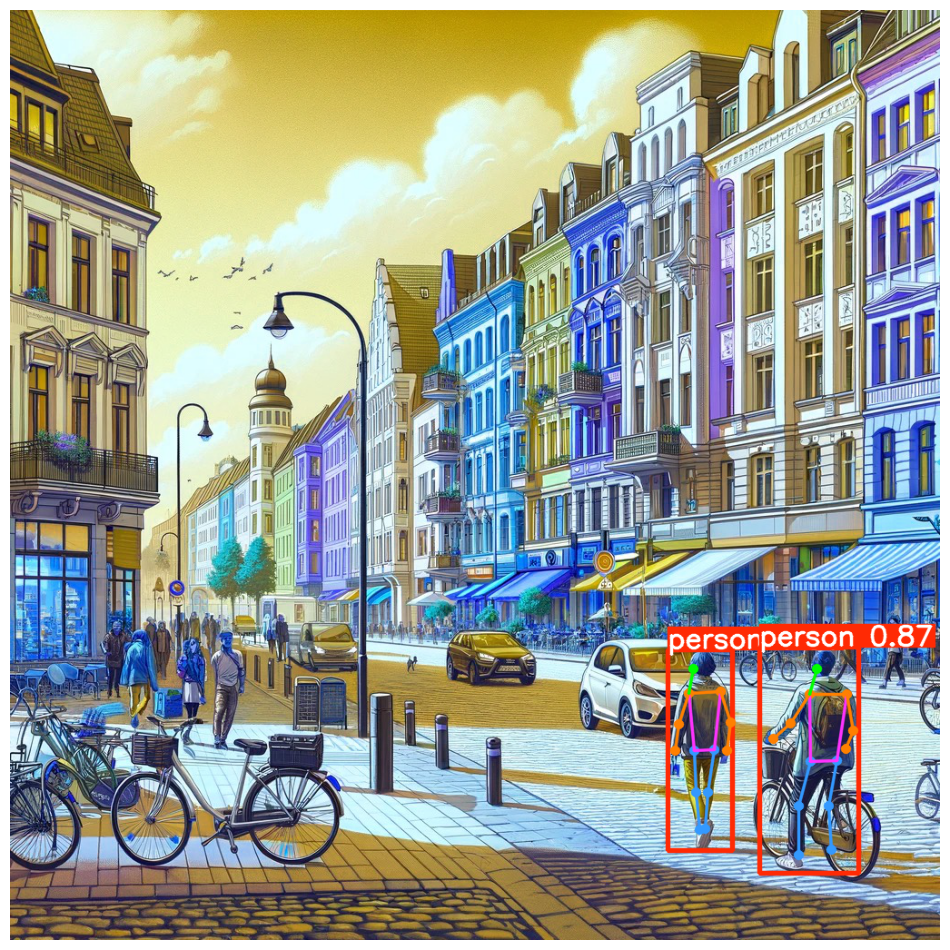

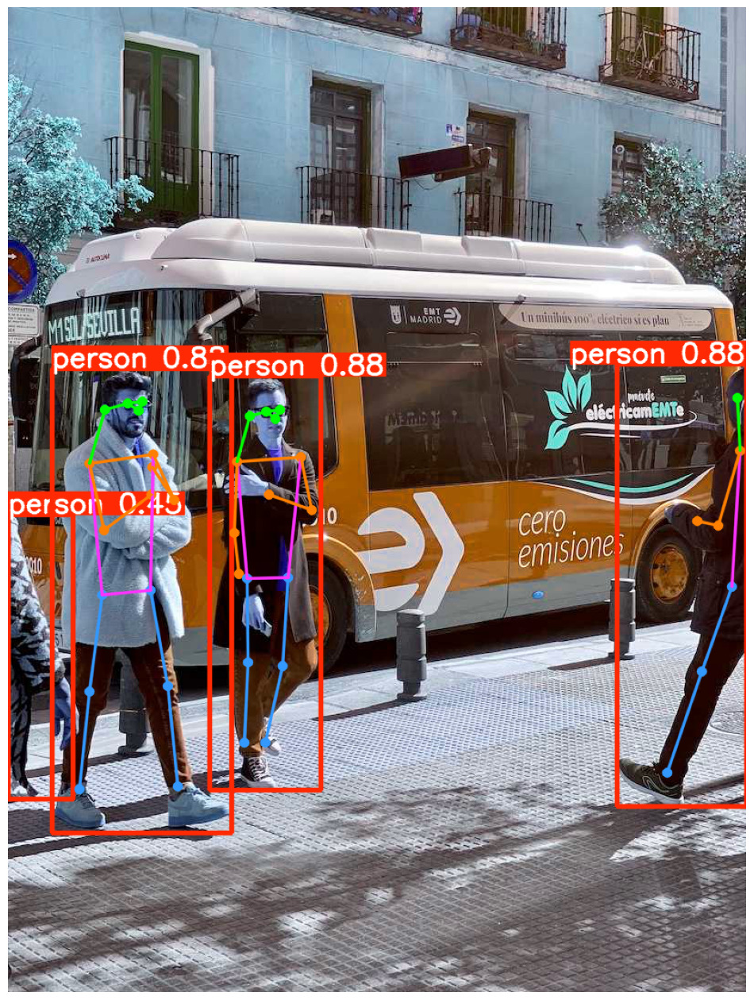

In [8]:
model = YOLO('Resultados/yolo11n-pose.pt')
image_paths = ["./deteccion_objetos.jpg", "./bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 5
Haz lo que se hace en el siguiente video:

https://www.youtube.com/watch?v=_YbEna8UNcU

Tienes parte del código en:

https://www.albertcoronado.com/2024/11/12/tutorial-yolo-11/

Para la parte fine tuning tienes que entrenar el modelo para que distina matrículas de coche, para entrenar el modelo utiliza el dataset que puedes descargar de:

https://universe.roboflow.com/parag-parmar-3qpin/car_license_plate-ypwmk/dataset/1

NOTA: HE CONSEGUIDO QUE FUNCIONE BIEN CV2 PERO ABRIENDO PRIMERO UNA IMAGEN:
```
img = cv2.imread('Datos/image3.jpg')
cv2.imshow("SAPA", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
```

In [9]:
model = YOLO("yolo11n.pt")

cap = cv2.VideoCapture(0)

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.7
color = (0, 250, 0)
thickness = 2

while True:
    success, img = cap.read()
    results = model( img, stream=True )

    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

            confidence = math.ceil((box.conf[0]*100))
            
            cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
            cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

    cv2.imshow('Webcam', img)

    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

[ WARN:0@4079.328] global cap_gstreamer.cpp:1173 isPipelinePlaying OpenCV | GStreamer warning: GStreamer: pipeline have not been created



0: 480x640 4 persons, 2 chairs, 1 tv, 34.9ms
Speed: 1.0ms preprocess, 34.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 2 chairs, 1 tv, 4.8ms
Speed: 1.3ms preprocess, 4.8ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 2 chairs, 1 tv, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 2 chairs, 1 tv, 5.1ms
Speed: 1.1ms preprocess, 5.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



qt.qpa.plugin: Could not find the Qt platform plugin "wayland" in ""
MESA-LOADER: failed to open iris: /usr/lib/dri/iris_dri.so: no se puede abrir el archivo del objeto compartido: No existe el archivo o el directorio (search paths /usr/lib/x86_64-linux-gnu/dri:\$${ORIGIN}/dri:/usr/lib/dri, suffix _dri)
failed to load driver: iris
MESA-LOADER: failed to open swrast: /usr/lib/dri/swrast_dri.so: no se puede abrir el archivo del objeto compartido: No existe el archivo o el directorio (search paths /usr/lib/x86_64-linux-gnu/dri:\$${ORIGIN}/dri:/usr/lib/dri, suffix _dri)


0: 480x640 3 persons, 1 chair, 1 tv, 4.8ms
Speed: 1.0ms preprocess, 4.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 2 chairs, 1 tv, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 2 chairs, 1 tv, 4.7ms
Speed: 0.9ms preprocess, 4.7ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 persons, 2 chairs, 1 tv, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 2 chairs, 1 tv, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 persons, 1 chair, 1 tv, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 persons, 2 chairs, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 persons,

In [10]:
import subprocess

# Definir el comando como una lista
cmd = [
    "yolo", 
    "task=detect", 
    "mode=train", 
    "epochs=20", 
    "batch=10", 
    "model=yolo11s", 
    "data=/home/iabd/Descargas/car_license_plate.v1i.yolov11/data.yaml"
]

# Ejecutar el comando y esperar a que termine
subprocess.run(cmd, check=True)


/home/iabd/anaconda3/envs/CloneSAPA/lib/python3.12/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(


New https://pypi.org/project/ultralytics/8.3.71 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.70 🚀 Python-3.12.8 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
engine/trainer: task=detect, mode=train, model=yolo11s, data=/home/iabd/Descargas/car_license_plate.v1i.yolov11/data.yaml, epochs=20, time=None, patience=100, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None,

train: Scanning /home/iabd/Descargas/car_license_plate.v1i.yolov11/train/labels.cache... 210 images, 0 backgrounds, 0 corrupt: 100%|██████████| 210/210 [00:00<?, ?it/s]
val: Scanning /home/iabd/Descargas/car_license_plate.v1i.yolov11/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]


Plotting labels to runs/detect/train7/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00046875), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train7
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.81G      1.823      7.528      1.595         22        640: 100%|██████████| 21/21 [00:02<00:00,  8.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.04it/s]


                   all         60         64      0.512      0.156      0.167     0.0905

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.79G      1.704      2.894      1.311         24        640: 100%|██████████| 21/21 [00:01<00:00, 10.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 11.61it/s]


                   all         60         64     0.0612      0.422      0.046      0.019

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20       2.8G      1.774      2.129      1.463         15        640: 100%|██████████| 21/21 [00:01<00:00, 11.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 11.07it/s]


                   all         60         64      0.306      0.281      0.158      0.055

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.81G      1.784      1.826      1.482         16        640: 100%|██████████| 21/21 [00:01<00:00, 10.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.56it/s]


                   all         60         64       0.17      0.172      0.102     0.0408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.81G      1.736      1.689      1.456         24        640: 100%|██████████| 21/21 [00:02<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.12it/s]


                   all         60         64    0.00525      0.375    0.00309    0.00129

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20       2.8G       1.74      1.594      1.517         15        640: 100%|██████████| 21/21 [00:02<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 13.67it/s]


                   all         60         64     0.0407      0.375     0.0268      0.011

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20       2.8G      1.689      1.411      1.404         24        640: 100%|██████████| 21/21 [00:02<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.32it/s]


                   all         60         64     0.0437      0.672     0.0378     0.0158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20       2.8G      1.691      1.413      1.418         23        640: 100%|██████████| 21/21 [00:02<00:00, 10.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.21it/s]


                   all         60         64      0.487      0.625       0.43       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20       2.8G      1.687       1.31      1.414         24        640: 100%|██████████| 21/21 [00:01<00:00, 10.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.63it/s]


                   all         60         64      0.556      0.438      0.369      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.81G      1.577       1.31       1.39         30        640: 100%|██████████| 21/21 [00:02<00:00, 10.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.05it/s]


                   all         60         64      0.377      0.547      0.366      0.165
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.79G      1.552       1.26      1.407         13        640: 100%|██████████| 21/21 [00:02<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.47it/s]


                   all         60         64      0.475      0.453      0.451      0.227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20       2.8G      1.545      1.193      1.378         10        640: 100%|██████████| 21/21 [00:02<00:00, 10.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.64it/s]


                   all         60         64      0.854       0.64      0.737      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20       2.8G      1.579      1.145      1.405         10        640: 100%|██████████| 21/21 [00:01<00:00, 10.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.97it/s]


                   all         60         64      0.749      0.609      0.699      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20       2.8G      1.557      1.058      1.357         10        640: 100%|██████████| 21/21 [00:02<00:00, 10.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.49it/s]


                   all         60         64      0.742      0.631       0.74      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20       2.8G      1.482      1.036      1.356         12        640: 100%|██████████| 21/21 [00:01<00:00, 11.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.04it/s]


                   all         60         64      0.785      0.688      0.755       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20       2.8G      1.538      1.028      1.355         11        640: 100%|██████████| 21/21 [00:01<00:00, 11.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.96it/s]


                   all         60         64      0.777      0.656      0.764      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20       2.8G      1.426     0.9933      1.334         10        640: 100%|██████████| 21/21 [00:01<00:00, 11.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.45it/s]


                   all         60         64      0.871      0.656      0.796      0.456

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      2.81G      1.413     0.9342      1.311         13        640: 100%|██████████| 21/21 [00:01<00:00, 11.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.65it/s]


                   all         60         64      0.833      0.703      0.812      0.444

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20       2.8G       1.42     0.8587      1.303         11        640: 100%|██████████| 21/21 [00:01<00:00, 11.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.44it/s]


                   all         60         64      0.836      0.714      0.817      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      2.81G      1.362     0.9014       1.26         13        640: 100%|██████████| 21/21 [00:01<00:00, 11.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.61it/s]


                   all         60         64      0.833       0.75       0.81      0.466

20 epochs completed in 0.016 hours.
Optimizer stripped from runs/detect/train7/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train7/weights/best.pt, 19.2MB

Validating runs/detect/train7/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.12.8 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 10.09it/s]


                   all         60         64      0.832       0.75      0.811      0.467
Speed: 0.2ms preprocess, 1.8ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train7
💡 Learn more at https://docs.ultralytics.com/modes/train


CompletedProcess(args=['yolo', 'task=detect', 'mode=train', 'epochs=20', 'batch=10', 'model=yolo11s', 'data=/home/iabd/Descargas/car_license_plate.v1i.yolov11/data.yaml'], returncode=0)

In [12]:
# Definir el comando como una lista de strings
cmd = [
    "yolo", "predict",
    "model=/home/iabd/Escritorio/IABD/IA/SAPA/Redes Neuronales/runs/detect/train6/weights/best.pt",
    "source=/home/iabd/Escritorio/IABD/IA/SAPA/Redes Neuronales/matricula.jpg",
    "conf=0.35"
]

# Ejecutar el comando y capturar la salida
result = subprocess.run(cmd, capture_output=True, text=True, encoding="utf-8")

# Imprimir la salida y los errores
print("Salida estándar:", result.stdout)
print("Errores:", result.stderr)



Salida estándar: Ultralytics 8.3.70 🚀 Python-3.12.8 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs

image 1/1 /home/iabd/Escritorio/IABD/IA/SAPA/Redes Neuronales/matricula.jpg: 416x640 1 licence, 32.9ms
Speed: 2.1ms preprocess, 32.9ms inference, 69.5ms postprocess per image at shape (1, 3, 416, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict

Errores: /home/iabd/anaconda3/envs/CloneSAPA/lib/python3.12/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(



In [13]:
# Cargar y mostrar la imagen
imagen = Image.open("/home/iabd/Escritorio/IABD/IA/SAPA/Redes Neuronales/runs/detect/predict2/matricula.jpg")
imagen.show()


## EJERCICIO 6
Repite el fine tuning del apartado anterior pero ahora en vez de como un comando en la terminal con código de python

In [18]:
# Cargar el modelo YOLO
model_matricula = YOLO("yolo11s")  

# Entrenar el modelo
model_matricula.train(
    data="/home/iabd/Descargas/car_license_plate.v1i.yolov11/data.yaml",  # Ruta al archivo de configuración
    epochs=20,   # Número de épocas
    batch=10,    # Tamaño del batch 
)


New https://pypi.org/project/ultralytics/8.3.71 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.70 🚀 Python-3.12.8 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/home/iabd/Descargas/car_license_plate.v1i.yolov11/data.yaml, epochs=20, time=None, patience=100, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train9, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=No

train: Scanning /home/iabd/Descargas/car_license_plate.v1i.yolov11/train/labels.cache... 210 images, 0 backgrounds, 0 corrupt: 100%|██████████| 210/210 [00:00<?, ?it/s]
val: Scanning /home/iabd/Descargas/car_license_plate.v1i.yolov11/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]


Plotting labels to runs/detect/train9/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00046875), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train9
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      3.01G      1.823      7.528      1.595         22        640: 100%|██████████| 21/21 [00:03<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 10.00it/s]

                   all         60         64      0.512      0.156      0.167     0.0905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      3.03G      1.704      2.894      1.311         24        640: 100%|██████████| 21/21 [00:02<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 10.97it/s]

                   all         60         64     0.0612      0.422      0.046      0.019



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      3.03G      1.774      2.129      1.463         15        640: 100%|██████████| 21/21 [00:01<00:00, 10.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 11.62it/s]

                   all         60         64      0.306      0.281      0.158      0.055



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      3.03G      1.784      1.826      1.482         16        640: 100%|██████████| 21/21 [00:02<00:00,  9.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.03it/s]


                   all         60         64       0.17      0.172      0.102     0.0408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      3.03G      1.736      1.689      1.456         24        640: 100%|██████████| 21/21 [00:02<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.32it/s]


                   all         60         64    0.00525      0.375    0.00309    0.00129

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      3.03G       1.74      1.594      1.517         15        640: 100%|██████████| 21/21 [00:02<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.47it/s]

                   all         60         64     0.0407      0.375     0.0268      0.011



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      3.03G      1.689      1.411      1.404         24        640: 100%|██████████| 21/21 [00:02<00:00,  9.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.12it/s]

                   all         60         64     0.0437      0.672     0.0378     0.0158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      3.03G      1.691      1.413      1.418         23        640: 100%|██████████| 21/21 [00:01<00:00, 11.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.78it/s]


                   all         60         64      0.487      0.625       0.43       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      3.03G      1.687       1.31      1.414         24        640: 100%|██████████| 21/21 [00:02<00:00, 10.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.50it/s]

                   all         60         64      0.556      0.438      0.369      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      3.03G      1.577       1.31       1.39         30        640: 100%|██████████| 21/21 [00:01<00:00, 10.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.48it/s]

                   all         60         64      0.377      0.547      0.366      0.165


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      3.02G      1.552       1.26      1.407         13        640: 100%|██████████| 21/21 [00:02<00:00,  8.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.78it/s]


                   all         60         64      0.475      0.453      0.451      0.227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      3.02G      1.545      1.193      1.378         10        640: 100%|██████████| 21/21 [00:01<00:00, 11.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.21it/s]

                   all         60         64      0.854       0.64      0.737      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      3.02G      1.579      1.145      1.405         10        640: 100%|██████████| 21/21 [00:01<00:00, 11.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 16.05it/s]

                   all         60         64      0.749      0.609      0.699      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      3.02G      1.557      1.058      1.357         10        640: 100%|██████████| 21/21 [00:01<00:00, 11.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 16.06it/s]

                   all         60         64      0.742      0.631       0.74      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      3.03G      1.482      1.036      1.356         12        640: 100%|██████████| 21/21 [00:01<00:00, 11.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.71it/s]

                   all         60         64      0.785      0.688      0.755       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      3.03G      1.538      1.028      1.355         11        640: 100%|██████████| 21/21 [00:01<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.05it/s]


                   all         60         64      0.777      0.656      0.764      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.03G      1.426     0.9933      1.334         10        640: 100%|██████████| 21/21 [00:01<00:00, 11.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.22it/s]

                   all         60         64      0.871      0.656      0.796      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      3.03G      1.413     0.9342      1.311         13        640: 100%|██████████| 21/21 [00:01<00:00, 11.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.99it/s]

                   all         60         64      0.833      0.703      0.812      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      3.02G       1.42     0.8587      1.303         11        640: 100%|██████████| 21/21 [00:01<00:00, 11.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.63it/s]

                   all         60         64      0.836      0.714      0.817      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      3.03G      1.362     0.9014       1.26         13        640: 100%|██████████| 21/21 [00:01<00:00, 11.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.74it/s]

                   all         60         64      0.833       0.75       0.81      0.466



20 epochs completed in 0.016 hours.
Optimizer stripped from runs/detect/train9/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train9/weights/best.pt, 19.2MB

Validating runs/detect/train9/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.12.8 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 12.03it/s]


                   all         60         64      0.832       0.75      0.811      0.467
Speed: 0.2ms preprocess, 1.8ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/train9


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f8ea073d3a0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [20]:
# Realizar una predicción en una imagen o video
results = model_matricula.predict("./matricula.jpg", conf=0.5)  # Ajusta el umbral de confianza si es necesario

# Mostrar resultados (opcional)
for r in results:
    r.show()  # Mostrar la imagen con las detecciones

# Guardar modelos
model_matricula.save("matricula.pt")  # Guardar el modelo entrenado



image 1/1 /home/iabd/Escritorio/IABD/IA/SAPA/Redes Neuronales/matricula.jpg: 416x640 1 licence, 5.7ms
Speed: 9.2ms preprocess, 5.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


## EJERCICIO 7
Vamos a contar los pasajeros de un autobus.

Sigue las instrucciones del siguiente video:

https://www.youtube.com/watch?v=hTI0Aj__SLE

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS


In [4]:
#from ultralytics.solutions.solutions import BaseSolution
#from ultralytics.utils.plotting import Annotator, colors
#import csv
#from datetime import datetime
#import os


class ObjectCounter(BaseSolution):
    """
    Una clase para gestionar el conteo de objetos en una transmisión de video en tiempo real basada en sus trayectorias.

    Esta clase extiende la clase BaseSolution y proporciona funcionalidades para contar objetos que entran y salen 
    de una región específica en una transmisión de video. Admite tanto regiones poligonales como lineales para el conteo.

    Atributos:
        in_count (int): Contador de objetos que se mueven hacia adentro.
        out_count (int): Contador de objetos que se mueven hacia afuera.
        counted_ids (List[int]): Lista de IDs de objetos que han sido contados.
        saved_ids (List[int]): Lista de IDs de objetos que han sido guardados en el archivo CSV.
        classwise_counts (Dict[str, Dict[str, int]]): Diccionario de conteos categorizados por clase de objeto.
        region_initialized (bool): Indicador de si la región de conteo ha sido inicializada.
        show_in (bool): Bandera para controlar la visualización del conteo de entrada.
        show_out (bool): Bandera para controlar la visualización del conteo de salida.
    """

    def __init__(self, **kwargs):
        """Inicializa la clase ObjectCounter para el conteo de objetos en tiempo real en transmisiones de video."""
        super().__init__(**kwargs)

        self.in_count = 0  # Contador de objetos que se mueven hacia adentro
        self.out_count = 0  # Contador de objetos que se mueven hacia afuera
        self.counted_ids = []  # Lista de IDs de objetos que han sido contados
        self.saved_ids = []  # Lista de IDs ya guardados en el archivo CSV
        self.classwise_counts = {}  # Diccionario de conteos, categorizados por clase de objeto
        self.region_initialized = False  # Variable booleana para la inicialización de la región

        self.show_in = self.CFG.get("show_in", True)
        self.show_out = self.CFG.get("show_out", True)

    def save_label_to_csv(self, track_id, label, action):
        """Guarda la etiqueta, track_id, acción y la hora actual en un archivo CSV con la fecha actual."""
        if track_id in self.saved_ids:
            return  # Omitir el guardado si el ID ya ha sido registrado

        current_time = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        current_date = datetime.now().strftime("%Y-%m-%d")  # Obtener la fecha actual como cadena de texto

        # Crear un nombre de archivo usando la fecha actual
        filename = f'tracked_objects_{current_date}.csv'

        # Verificar si el archivo existe para decidir si se deben escribir los encabezados
        file_exists = os.path.isfile(filename)

        with open(filename, mode='a', newline='') as file:
            writer = csv.writer(file)

            # Escribir los encabezados solo si el archivo no existe
            if not file_exists:
                writer.writerow(['track_id', 'label', 'action', 'date', 'time'])

            # Escribir la fila de datos con la columna de acción
            writer.writerow([track_id, label, action, current_time.split()[0], current_time.split()[1]])
            self.saved_ids.append(track_id)  # Marcar el ID como guardado

    def count_objects(self, current_centroid, track_id, prev_position, cls):
        """
        Cuenta objetos dentro de una región poligonal o lineal basada en sus trayectorias.

        Args:
            current_centroid (Tuple[float, float]): Coordenadas del centroide en el cuadro actual.
            track_id (int): Identificador único para el objeto rastreado.
            prev_position (Tuple[float, float]): Coordenadas (x, y) de la posición anterior en el cuadro previo.
            cls (int): Índice de clase para la actualización de conteo por clase.
        """
        if prev_position is None or track_id in self.counted_ids:
            return

        action = None  # La acción por defecto es None

        if len(self.region) == 2:  # Región lineal (definida como un segmento de línea)
            line = self.LineString(self.region)
            if line.intersects(self.LineString([prev_position, current_centroid])):
                if abs(self.region[0][0] - self.region[1][0]) < abs(self.region[0][1] - self.region[1][1]):
                    if current_centroid[0] > prev_position[0]:  # Moviéndose hacia la derecha
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose hacia la izquierda
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                else:
                    if current_centroid[1] > prev_position[1]:  # Moviéndose hacia abajo
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose hacia arriba
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                self.counted_ids.append(track_id)

        elif len(self.region) > 2:  # Región poligonal
            polygon = self.Polygon(self.region)
            if polygon.contains(self.Point(current_centroid)):
                region_width = max([p[0] for p in self.region]) - min([p[0] for p in self.region])
                region_height = max([p[1] for p in self.region]) - min([p[1] for p in self.region])

                if region_width < region_height:
                    if current_centroid[0] > prev_position[0]:  # Moviéndose hacia la derecha
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose hacia la izquierda
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                else:
                    if current_centroid[1] > prev_position[1]:  # Moviéndose hacia abajo
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose hacia arriba
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                self.counted_ids.append(track_id)

        # Guardar la etiqueta con la acción
        if action:
            label = f"{self.names[cls]} ID: {track_id}"
            self.save_label_to_csv(track_id, label, action)

    def store_classwise_counts(self, cls):
        """Inicializa los conteos por clase de objeto si aún no existen."""
        if self.names[cls] not in self.classwise_counts:
            self.classwise_counts[self.names[cls]] = {"IN": 0, "OUT": 0}

    def display_counts(self, im0):
        """Muestra los conteos de objetos en la imagen o cuadro de video."""
        labels_dict = {
            str.capitalize(key): f"{'IN ' + str(value['IN']) if self.show_in else ''} "
            f"{'OUT ' + str(value['OUT']) if self.show_out else ''}".strip()
            for key, value in self.classwise_counts.items()
            if value["IN"] != 0 or value["OUT"] != 0
        }

        if labels_dict:
            self.annotator.display_analytics(im0, labels_dict, (104, 31, 17), (255, 255, 255), 10)

        for track_id in self.track_ids:
            if track_id in self.counted_ids:
                in_count = self.in_count
                label = f"ID:{track_id} count at number {in_count}"
                self.annotator.box_label(self.boxes[self.track_ids.index(track_id)], label=label, color=(255, 255, 0))

    def count(self, im0):
        """Procesa los datos de entrada (cuadros o rastros de objetos) y actualiza los conteos de objetos."""
        if not self.region_initialized:
            self.initialize_region()
            self.region_initialized = True

        self.annotator = Annotator(im0, line_width=self.line_width)
        self.extract_tracks(im0)
        self.annotator.draw_region(reg_pts=self.region, color=(104, 0, 123), thickness=self.line_width * 2)

        return im0


In [ ]:
#import cv2
#from tracker1 import ObjectCounter  # Importando ObjectCounter desde tracker.py

# Definir la función de callback del mouse
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:  # Verificar el movimiento del mouse
        point = [x, y]
        print(f"El mouse se movió a: {point}")

# Abrir el archivo de video
cap = cv2.VideoCapture('1.mp4')

# Definir los puntos de la región para el conteo
region_points = [(386,103), (458, 499)]

# Inicializar el contador de objetos
counter = ObjectCounter(
    region=region_points,  # Pasar los puntos de la región
    model="yolo11s.pt",  # Modelo para el conteo de objetos
    classes=[0],  # Detectar solo la clase "persona"
    show_in=True,  # Mostrar conteo de entradas
    show_out=True,  # Mostrar conteo de salidas
    line_width=2,  # Ajustar el grosor de la línea para la visualización
)

# Crear una ventana con nombre y asignar la función de callback del mouse
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    # Leer un fotograma del video
    ret, frame = cap.read()
    if not ret:
        break
        # Si el video termina, reiniciar desde el principio
#        cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
#        continue
    count += 1
    if count % 2 != 0:  # Omitir fotogramas impares
        continue

    frame = cv2.resize(frame, (1020, 500))

    # Procesar el fotograma con el contador de objetos
    frame = counter.count(frame)

    # Mostrar el fotograma
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):  # Presionar 'q' para salir
        break

# Liberar el objeto de captura de video y cerrar la ventana de visualización
cap.release()
cv2.destroyAllWindows()


## EJERCICIO 8
Adapta el código anterior para que cuente vehículos en el video vehicle-counting.mp4 (tiene que contar por separado coches y camiones)

In [ ]:
import cv2
from tracker1 import ObjectCounter  # Importando ObjectCounter desde tracker.py

# Definir la función de callback del mouse
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:  # Verificar el movimiento del mouse
        point = [x, y]
        print(f"El mouse se movió a: {point}")

# Abrir el archivo de video
cap = cv2.VideoCapture('vehicle-counting.mp4')

# Definir los puntos de la región para el conteo
# Estos puntos pueden ajustarse dependiendo del área donde quieres contar los vehículos en el video.
region_points = [(10, 300), (1000, 300)]  # Ajusta esta región según el video

# Inicializar el contador de objetos
counter = ObjectCounter(
    region=region_points,  # Pasar los puntos de la región
    model="yolo11s.pt",  # Modelo para el conteo de objetos (ajustar si es necesario)
    classes=[2, 7],  # Detectar solo "car" (clase 2) y "truck" (clase 7) en YOLO
    show_in=True,  # Mostrar conteo de entrada
    show_out=True,  # Mostrar conteo de salida
    line_width=2,  # Ajustar el grosor de la línea para la visualización
)

# Crear una ventana con nombre y asignar la función de callback del mouse
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    # Leer un fotograma del video
    ret, frame = cap.read()
    if not ret:
        break
        # Si el video termina, reiniciar desde el principio
#        cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
#        continue
    count += 1
    if count % 2 != 0:  # Omitir fotogramas impares para optimizar el rendimiento
        continue

    frame = cv2.resize(frame, (1020, 500))

    # Procesar el fotograma con el contador de objetos
    frame = counter.count(frame)

    # Mostrar el fotograma
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):  # Presionar 'q' para salir
        break

# Liberar el objeto de captura de video y cerrar la ventana de visualización
cap.release()
cv2.destroyAllWindows()


## EJERCICIO 9
Adapta el ejercicio anterior para que en vez de coches cuente matrículas usando el modelo que has creado en el ejercicio 6. 

Si el video del apartado anterior no te sirve porque no se ven bien las matrículas crea un video con la IA generativa (si el video creado es demasiado corto junta varios videos en uno)

## EJERCICIO 10
Vamos a hacer fine tuning sobre el modelo para segmentación SAM-2.

Puedes sacar información de la siguiente página:

https://blog.roboflow.com/fine-tune-sam-2-1/

A la hora de conseguir el dataset, descargalo para no tener problemas con la API-KEY de Roboflow

## EJERCICIO 11 (OPCIONAL)
Haz fine tuning con sam2 o yolo11 para segmentación con otro dataset 

## EJERCICIO 12 (OPCIONAL)
En el siguiente enlace encontraras diferentes modelos y trabajos sobre la visión por computación, prueba alguno de ellos (algunos que no funcionan porque las librerías se han actualizado y tienes que adaptarlos, otros son recientes y no deberías tener problemas).

https://github.com/roboflow/notebooks

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS